### Import & Konfigurasi Global

In [1]:
!pip install opencv-python

import json
import sys
import random
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
import pandas as pd
import seaborn as sns
import yaml
from PIL import Image

# --- Tambahkan ROOT ke sys.path agar src/ bisa diimport ---
ROOT_DIR = Path("..").resolve()
if str(ROOT_DIR) not in sys.path:
    sys.path.insert(0, str(ROOT_DIR))

# --- Style global matplotlib ---
plt.rcParams.update({
    "figure.dpi"      : 120,
    "figure.facecolor": "white",
    "axes.facecolor"  : "white",
    "axes.grid"       : True,
    "grid.alpha"      : 0.3,
    "font.size"       : 11,
    "axes.titlesize"  : 13,
    "axes.labelsize"  : 11,
})
sns.set_palette("husl")

# --- Load konfigurasi ---
CONFIG_PATH = ROOT_DIR / "configs" / "cv.yaml"
with open(CONFIG_PATH, "r") as f:
    CONFIG = yaml.safe_load(f)

DATASET_PATH    = ROOT_DIR / CONFIG.get("path", "data/vision")
PROCESSED_DIR   = DATASET_PATH / "processed"
COCO_JSON_PATH  = DATASET_PATH / "raw" / "dronewaste_v1.0.json"
OUTPUT_CSV_PATH = ROOT_DIR / "outputs" / "output_fitur_ann_ke_fuzzy.csv"
CLASS_NAMES     = CONFIG.get("names", {})

print(f"ROOT_DIR     : {ROOT_DIR}")
print(f"DATASET_PATH : {DATASET_PATH}")
print(f"Jumlah kelas : {len(CLASS_NAMES)}")
print(f"Nama kelas   : {list(CLASS_NAMES.values())}")

ROOT_DIR     : D:\Arsip Hafizh Fadhl Muhammad\Project\aerosweep
DATASET_PATH : D:\Arsip Hafizh Fadhl Muhammad\Project\aerosweep\data\vision
Jumlah kelas : 20
Nama kelas   : ['Rubble', 'Construction and demolition materials', 'Asphalt milling', 'Excavation materials', 'Appliances', 'Electronic equipment', 'Furniture', 'Metal barrels', 'Plastic packaging', 'Wood', 'Pallets', 'Scrap', 'Plastic', 'Vehicles', 'Tyres', 'Paper', 'Foundry', 'Asbestos', 'Textile', 'Mixed items']


### Visualisasi Sample Patch Hasil Sliding Window

Total patch (train): 15977
Menampilkan 9 sample acak:



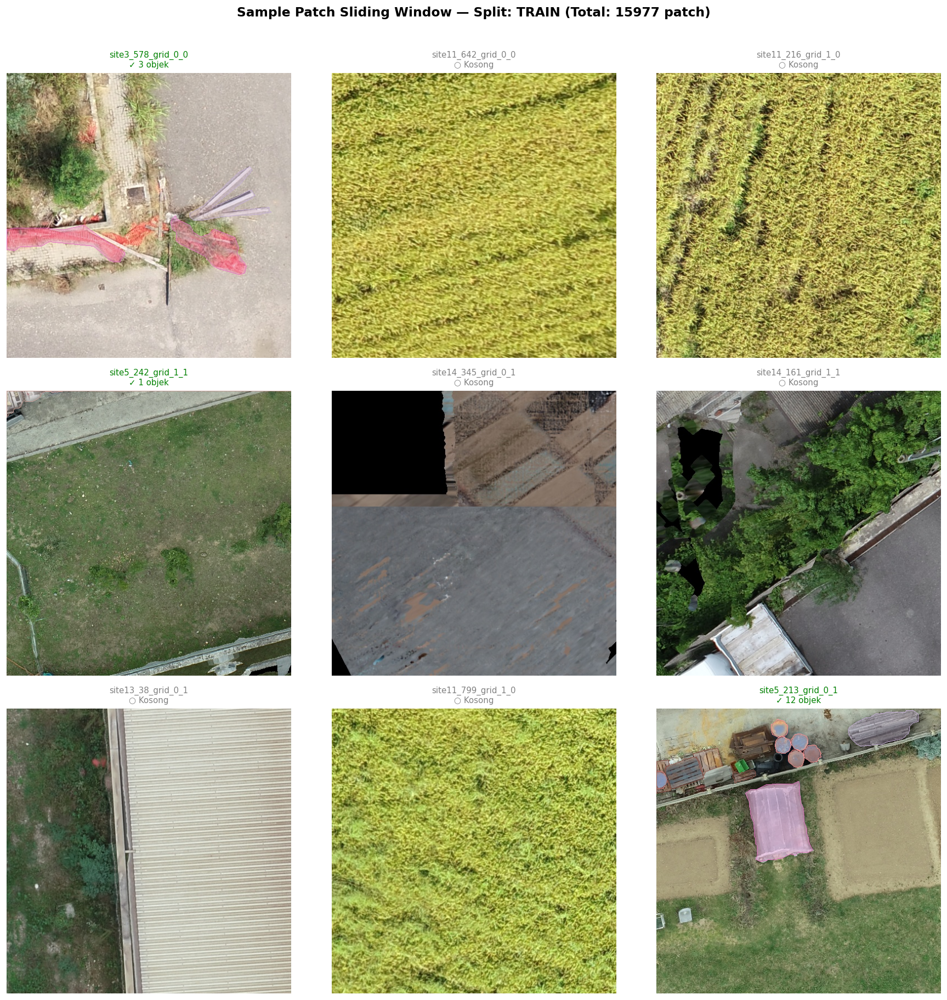

Gambar disimpan di: outputs/visual_sliding_window_train.png


In [2]:
def visualize_sliding_window_samples(
    processed_dir: Path,
    n_samples:     int = 9,
    split:         str = "train",
    seed:          int = 42,
):
    """
    Tampilkan n_samples patch acak dari hasil sliding window.

    Parameter
    ---------
    processed_dir : Path ke data/vision/processed/
    n_samples     : Jumlah patch yang ditampilkan (default 9 = grid 3x3)
    split         : "train" atau "val"
    seed          : Random seed untuk reproduktibilitas
    """
    img_dir = processed_dir / split / "images"
    lbl_dir = processed_dir / split / "labels"

    if not img_dir.exists():
        print(f"[ERROR] Folder tidak ditemukan: {img_dir}")
        print("Jalankan scripts/01_preprocessing.py terlebih dahulu.")
        return

    # Kumpulkan semua patch
    all_patches = sorted(img_dir.glob("*.jpg"))
    if not all_patches:
        print(f"[ERROR] Tidak ada patch di: {img_dir}")
        return

    # Ambil sample acak
    random.seed(seed)
    samples = random.sample(all_patches, min(n_samples, len(all_patches)))

    print(f"Total patch ({split}): {len(all_patches)}")
    print(f"Menampilkan {len(samples)} sample acak:\n")

    # Buat grid plot
    ncols  = 3
    nrows  = (len(samples) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows))
    axes = axes.flatten() if nrows > 1 else [axes] if ncols == 1 else axes.flatten()

    for idx, patch_path in enumerate(samples):
        ax = axes[idx]

        # Baca citra
        img_bgr = cv2.imread(str(patch_path))
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # Baca label YOLO jika ada
        lbl_path    = lbl_dir / (patch_path.stem + ".txt")
        has_annot   = lbl_path.exists() and lbl_path.stat().st_size > 0
        n_instances = 0

        if has_annot:
            with open(lbl_path) as f:
                lines = [l.strip() for l in f if l.strip()]
            n_instances = len(lines)

            # Gambar polygon segmentasi dari label YOLO
            h, w = img_rgb.shape[:2]
            for line in lines:
                parts = line.split()
                if len(parts) < 7:
                    continue
                class_id = int(parts[0])
                coords   = list(map(float, parts[1:]))
                xs = [int(coords[i]     * w) for i in range(0, len(coords), 2)]
                ys = [int(coords[i + 1] * h) for i in range(0, len(coords), 2)]
                pts = np.array(list(zip(xs, ys)), dtype=np.int32)

                # Overlay polygon semi-transparan
                overlay = img_rgb.copy()
                color   = tuple(
                    int(c * 255) for c in
                    plt.cm.tab20(class_id % 20)[:3]
                )
                cv2.fillPoly(overlay, [pts], color)
                img_rgb = cv2.addWeighted(overlay, 0.35, img_rgb, 0.65, 0)
                cv2.polylines(img_rgb, [pts], True, color, 1)

        ax.imshow(img_rgb)
        ax.set_title(
            f"{patch_path.stem}\n"
            f"{'✓ ' + str(n_instances) + ' objek' if has_annot else '○ Kosong'}",
            fontsize=9,
            color="green" if has_annot else "gray",
        )
        ax.axis("off")

    # Sembunyikan axes yang tidak terpakai
    for idx in range(len(samples), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        f"Sample Patch Sliding Window — Split: {split.upper()} "
        f"(Total: {len(all_patches)} patch)",
        fontsize=14,
        fontweight="bold",
        y=1.01,
    )
    plt.tight_layout()
    plt.savefig(
        ROOT_DIR / "outputs" / f"visual_sliding_window_{split}.png",
        bbox_inches="tight", dpi=120,
    )
    plt.show()
    print(f"Gambar disimpan di: outputs/visual_sliding_window_{split}.png")


# Jalankan
visualize_sliding_window_samples(PROCESSED_DIR, n_samples=9, split="train")

### Plot Distribusi Kelas

Memuat COCO JSON...


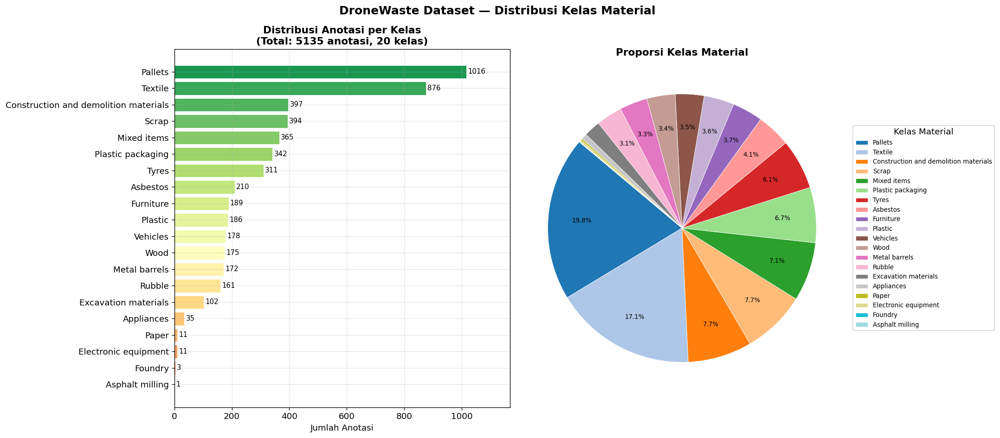

Gambar disimpan di: outputs/visual_class_distribution.png

Ringkasan distribusi kelas:
                                kelas  jumlah  persentase
                              Pallets    1016       19.79
                              Textile     876       17.06
Construction and demolition materials     397        7.73
                                Scrap     394        7.67
                          Mixed items     365        7.11
                    Plastic packaging     342        6.66
                                Tyres     311        6.06
                             Asbestos     210        4.09
                            Furniture     189        3.68
                              Plastic     186        3.62
                             Vehicles     178        3.47
                                 Wood     175        3.41
                        Metal barrels     172        3.35
                               Rubble     161        3.14
                 Excavation materials     1

In [3]:
def plot_class_distribution(coco_json_path: Path, class_names: dict):
    """
    Baca dronewaste_v1.0.json dan plot distribusi anotasi per kelas.

    Menampilkan dua chart:
    1. Bar chart horizontal — jumlah anotasi per kelas
    2. Pie chart — proporsi tiap kelas

    Parameter
    ---------
    coco_json_path : Path ke dronewaste_v1.0.json
    class_names    : Dict {yolo_id: nama_kelas} dari cv.yaml
    """
    if not coco_json_path.exists():
        print(f"[ERROR] File tidak ditemukan: {coco_json_path}")
        return

    print("Memuat COCO JSON...")
    with open(coco_json_path, "r") as f:
        coco_data = json.load(f)

    # Bangun mapping coco_id → yolo_id
    categories   = sorted(coco_data["categories"], key=lambda x: x["id"])
    coco_to_yolo = {
        cat["id"]: idx for idx, cat in enumerate(categories)
    }

    # Hitung jumlah anotasi per kelas
    counts = {yolo_id: 0 for yolo_id in class_names}
    for ann in coco_data["annotations"]:
        yolo_id = coco_to_yolo.get(ann["category_id"])
        if yolo_id is not None and yolo_id in counts:
            counts[yolo_id] += 1

    # Konversi ke DataFrame untuk plotting
    df_counts = pd.DataFrame([
        {"kelas": class_names.get(k, f"class_{k}"), "jumlah": v}
        for k, v in counts.items()
    ]).sort_values("jumlah", ascending=True)

    # --- Plot ---
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))

    # Bar chart horizontal
    colors = plt.cm.RdYlGn(
        np.linspace(0.2, 0.9, len(df_counts))
    )
    bars = axes[0].barh(
        df_counts["kelas"],
        df_counts["jumlah"],
        color=colors,
        edgecolor="white",
        linewidth=0.5,
    )
    # Tambahkan label jumlah di ujung bar
    for bar, val in zip(bars, df_counts["jumlah"]):
        axes[0].text(
            bar.get_width() + 5,
            bar.get_y() + bar.get_height() / 2,
            str(val),
            va="center", ha="left",
            fontsize=9, color="black",
        )
    axes[0].set_xlabel("Jumlah Anotasi")
    axes[0].set_title(
        f"Distribusi Anotasi per Kelas\n"
        f"(Total: {sum(counts.values())} anotasi, {len(class_names)} kelas)",
        fontweight="bold",
    )
    axes[0].set_xlim(0, df_counts["jumlah"].max() * 1.15)

    # Pie chart — hanya tampilkan kelas dengan anotasi > 0
    df_pie = df_counts[df_counts["jumlah"] > 0].sort_values(
        "jumlah", ascending=False
    )
    wedge_colors = plt.cm.tab20(np.linspace(0, 1, len(df_pie)))
    wedges, texts, autotexts = axes[1].pie(
        df_pie["jumlah"],
        labels=None,
        autopct=lambda p: f"{p:.1f}%" if p > 3 else "",
        colors=wedge_colors,
        startangle=140,
        pctdistance=0.75,
        wedgeprops={"linewidth": 0.5, "edgecolor": "white"},
    )
    for autotext in autotexts:
        autotext.set_fontsize(8)

    axes[1].legend(
        wedges,
        df_pie["kelas"],
        title="Kelas Material",
        loc="center left",
        bbox_to_anchor=(1.0, 0.5),
        fontsize=8,
    )
    axes[1].set_title(
        "Proporsi Kelas Material",
        fontweight="bold",
    )

    plt.suptitle(
        "DroneWaste Dataset — Distribusi Kelas Material",
        fontsize=15, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig(
        ROOT_DIR / "outputs" / "visual_class_distribution.png",
        bbox_inches="tight", dpi=120,
    )
    plt.show()
    print(f"Gambar disimpan di: outputs/visual_class_distribution.png")

    # Tampilkan tabel ringkasan
    df_display = df_counts.sort_values("jumlah", ascending=False).copy()
    df_display["persentase"] = (
        df_display["jumlah"] / df_display["jumlah"].sum() * 100
    ).round(2)
    print("\nRingkasan distribusi kelas:")
    print(df_display.to_string(index=False))


# Jalankan
plot_class_distribution(COCO_JSON_PATH, CLASS_NAMES)

### Visualisasi Hasil Inferensi pada Sample Grid

2026-05-26 01:07:38 [INFO] AeroSweep.inference_cv — Validasi path model & config: OK ✓
2026-05-26 01:07:38 [INFO] AeroSweep.inference_cv — Nama kelas dimuat: 20 kelas
2026-05-26 01:07:38 [INFO] AeroSweep.inference_cv — Memuat model dari: D:\Arsip Hafizh Fadhl Muhammad\Project\aerosweep\models\nn_weights\aerosweep_trained\weights\best.pt
2026-05-26 01:07:38 [INFO] AeroSweep.inference_cv — Model berhasil dimuat ✓
2026-05-26 01:07:38 [INFO] AeroSweep.inference_cv — FeatureExtractor siap: model=best.pt, kelas=20, conf=0.25, device=cpu


Memvisualisasikan 6 grid sample...



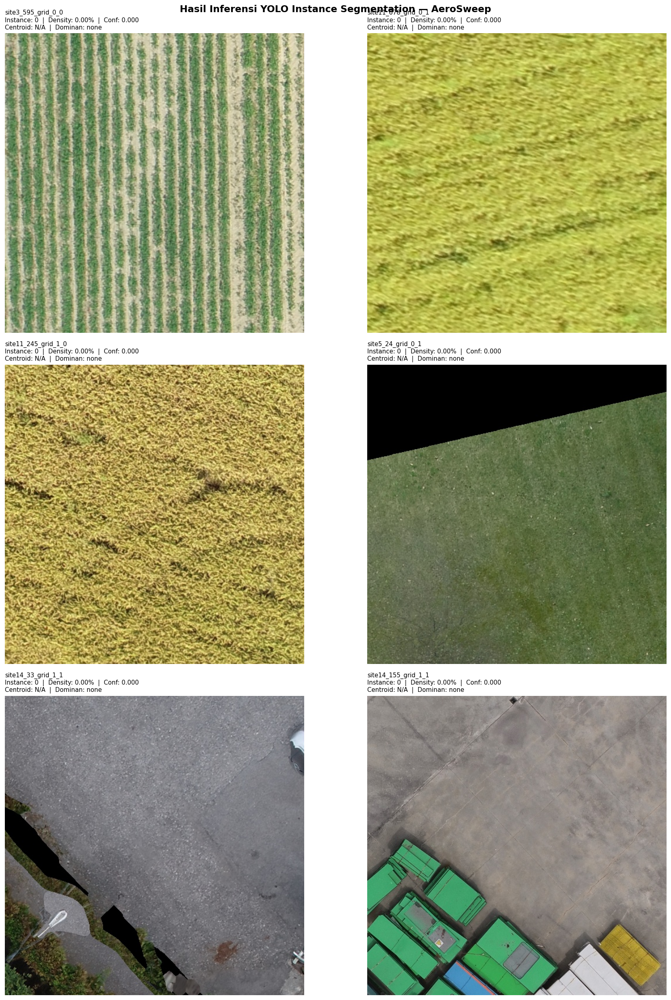

Gambar disimpan di: outputs/visual_inference_samples.png


In [4]:
!pip install ultralytics

def visualize_inference_samples(
    n_samples:     int   = 6,
    conf:          float = 0.25,
    seed:          int   = 42,
):
    """
    Jalankan inferensi pada n_samples grid acak dan tampilkan hasilnya.
    Menampilkan overlay mask, bounding box, centroid, dan 6 metrik.

    Parameter
    ---------
    n_samples : Jumlah grid yang divisualisasikan
    conf      : Confidence threshold
    seed      : Random seed
    """
    from ultralytics import YOLO
    from src.aerosweep.neuro.inference_cv import FeatureExtractor

    # Resolve path model dari cv.yaml
    infer_cfg  = CONFIG.get("inference", {})
    model_path = ROOT_DIR / infer_cfg.get(
        "model_path",
        "models/nn_weights/aerosweep_trained/weights/best.pt"
    )
    grid_dir   = ROOT_DIR / infer_cfg.get(
        "source", "data/vision/test_grids"
    )

    if not model_path.exists():
        print(f"[ERROR] Model tidak ditemukan: {model_path}")
        print("Jalankan scripts/02_train_cv.py terlebih dahulu.")
        return

    if not grid_dir.exists() or not list(grid_dir.glob("*.jpg")):
        print(f"[ERROR] Tidak ada grid di: {grid_dir}")
        return

    # Inisialisasi extractor
    extractor = FeatureExtractor(
        model_path     = str(model_path),
        config_path    = str(CONFIG_PATH),
        conf_threshold = conf,
        device         = "cpu",  # CPU untuk notebook (aman di semua env)
    )

    # Ambil sample acak
    all_grids = sorted(list(grid_dir.glob("*.jpg")))
    random.seed(seed)
    samples = random.sample(all_grids, min(n_samples, len(all_grids)))

    print(f"Memvisualisasikan {len(samples)} grid sample...\n")

    # --- Plot grid hasil inferensi ---
    ncols = 2
    nrows = (len(samples) + 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(16, 7 * nrows))
    axes = axes.flatten()

    for idx, grid_path in enumerate(samples):
        ax = axes[idx]

        # Proses satu grid → ekstrak 6 metrik
        row = extractor.process_single_grid(grid_path)

        # Baca citra dan jalankan inferensi lagi untuk visualisasi
        from ultralytics import YOLO
        model      = YOLO(str(model_path))
        predictions = model.predict(
            str(grid_path),
            conf=conf, verbose=False, retina_masks=True
        )
        result = predictions[0]

        # Plot dengan overlay bawaan Ultralytics
        annotated = result.plot(
            conf=True, labels=True, masks=True, boxes=True, line_width=1
        )
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        # Gambar centroid jika terdeteksi
        cx = row["centroid_x"]
        cy = row["centroid_y"]
        if cx >= 0 and cy >= 0:
            cv2.circle(annotated_rgb, (int(cx), int(cy)), 8,  (255, 255, 255), -1)
            cv2.circle(annotated_rgb, (int(cx), int(cy)), 6,  (255, 50,  50),  -1)
            cv2.line(annotated_rgb,
                (int(cx)-14, int(cy)), (int(cx)+14, int(cy)), (255, 50, 50), 2)
            cv2.line(annotated_rgb,
                (int(cx), int(cy)-14), (int(cx), int(cy)+14), (255, 50, 50), 2)

        ax.imshow(annotated_rgb)

        # Judul dengan 6 metrik
        centroid_str = (
            f"({cx:.1f}, {cy:.1f})"
            if cx >= 0 else "N/A"
        )
        title = (
            f"{row['grid_id']}\n"
            f"Instance: {row['jumlah_instance']}  |  "
            f"Density: {row['area_density_pct']:.2f}%  |  "
            f"Conf: {row['confidence_score']:.3f}\n"
            f"Centroid: {centroid_str}  |  "
            f"Dominan: {row['kategori_dominan']}"
        )
        ax.set_title(title, fontsize=9, loc="left")
        ax.axis("off")

    # Sembunyikan axes kosong
    for idx in range(len(samples), len(axes)):
        axes[idx].axis("off")

    plt.suptitle(
        "Hasil Inferensi YOLO Instance Segmentation — AeroSweep",
        fontsize=14, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig(
        ROOT_DIR / "outputs" / "visual_inference_samples.png",
        bbox_inches="tight", dpi=120,
    )
    plt.show()
    print("Gambar disimpan di: outputs/visual_inference_samples.png")


# Jalankan
visualize_inference_samples(n_samples=6, conf=0.25)


### Preview DataFrame & Statistik Deskriptif

In [5]:
def preview_output_dataframe(csv_path: Path):
    """
    Baca output_fitur_ann_ke_fuzzy.csv dan tampilkan:
    - 10 baris pertama
    - Info tipe data kolom
    - Statistik deskriptif
    - Persentase grid kosong vs terisi

    Parameter
    ---------
    csv_path : Path ke file CSV output
    """
    if not csv_path.exists():
        print(f"[ERROR] File CSV tidak ditemukan: {csv_path}")
        print("Jalankan scripts/03_inference_extraction.py terlebih dahulu.")
        return

    df = pd.read_csv(csv_path)

    print(f"File      : {csv_path}")
    print(f"Dimensi   : {df.shape[0]} baris × {df.shape[1]} kolom")
    print(f"Kolom     : {list(df.columns)}\n")

    # --- Info tipe data ---
    print("=" * 50)
    print("INFO KOLOM:")
    print("=" * 50)
    print(df.dtypes.to_string())
    print()

    # --- Preview 10 baris pertama ---
    print("=" * 50)
    print("10 BARIS PERTAMA:")
    print("=" * 50)
    with pd.option_context(
        "display.max_columns", None,
        "display.width",       None,
        "display.float_format", "{:.4f}".format,
    ):
        print(df.head(10).to_string(index=False))
    print()

    # --- Statistik deskriptif ---
    print("=" * 50)
    print("STATISTIK DESKRIPTIF (kolom numerik):")
    print("=" * 50)
    numeric_cols = [
        "centroid_x", "centroid_y",
        "area_density_pct", "jumlah_instance", "confidence_score"
    ]
    numeric_cols = [c for c in numeric_cols if c in df.columns]
    print(df[numeric_cols].describe().round(4).to_string())
    print()

    # --- Grid kosong vs terisi ---
    if "jumlah_instance" in df.columns:
        n_total    = len(df)
        n_detected = (df["jumlah_instance"] > 0).sum()
        n_empty    = (df["jumlah_instance"] == 0).sum()
        print("=" * 50)
        print("DISTRIBUSI GRID:")
        print("=" * 50)
        print(f"  Total grid      : {n_total}")
        print(f"  Dengan deteksi  : {n_detected} ({n_detected/n_total*100:.1f}%)")
        print(f"  Tanpa deteksi   : {n_empty}    ({n_empty/n_total*100:.1f}%)")

    # --- Cek missing values ---
    missing = df.isnull().sum()
    if missing.any():
        print("\n[WARNING] Missing values ditemukan:")
        print(missing[missing > 0].to_string())
    else:
        print("\n✓ Tidak ada missing values")


# Jalankan
preview_output_dataframe(OUTPUT_CSV_PATH)

File      : D:\Arsip Hafizh Fadhl Muhammad\Project\aerosweep\outputs\output_fitur_ann_ke_fuzzy.csv
Dimensi   : 3995 baris × 9 kolom
Kolom     : ['grid_id', 'centroid_x', 'centroid_y', 'area_density_pct', 'jumlah_instance', 'kategori_dominan', 'confidence_score', 'processed_at', 'has_detection']

INFO KOLOM:
grid_id              object
centroid_x          float64
centroid_y          float64
area_density_pct    float64
jumlah_instance       int64
kategori_dominan     object
confidence_score    float64
processed_at         object
has_detection         int64

10 BARIS PERTAMA:
           grid_id  centroid_x  centroid_y  area_density_pct  jumlah_instance kategori_dominan  confidence_score        processed_at  has_detection
site10_13_grid_0_1     -1.0000     -1.0000            0.0000                0             none            0.0000 2026-05-26 01:05:43              0
site10_17_grid_1_0     -1.0000     -1.0000            0.0000                0             none            0.0000 2026-05-26 

### Heatmap Kepadatan Sampah

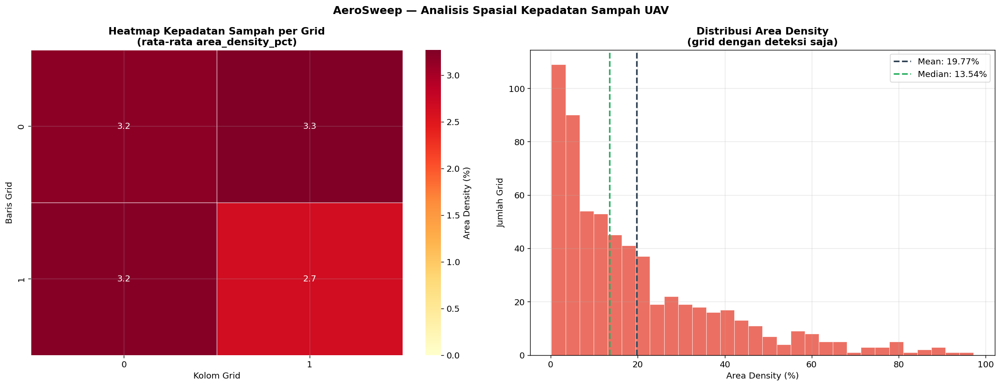

Gambar disimpan di: outputs/visual_density_heatmap.png


In [6]:
def plot_density_heatmap(csv_path: Path):
    """
    Buat heatmap 2D dari area_density_pct berdasarkan
    posisi grid (row, col) yang di-parse dari nama grid_id.

    Format nama grid: {img_stem}_grid_{row}_{col}
    Contoh: UAV_site01_grid_3_7 → row=3, col=7

    Jika dataset multi-image, heatmap menampilkan
    rata-rata density per posisi grid.

    Parameter
    ---------
    csv_path : Path ke output_fitur_ann_ke_fuzzy.csv
    """
    if not csv_path.exists():
        print(f"[ERROR] File CSV tidak ditemukan: {csv_path}")
        return

    df = pd.read_csv(csv_path)

    if "grid_id" not in df.columns or "area_density_pct" not in df.columns:
        print("[ERROR] Kolom grid_id atau area_density_pct tidak ditemukan.")
        return

    # Parse koordinat grid dari nama grid_id
    def parse_grid_coords(grid_id: str):
        """Ekstrak (row, col) dari nama grid: ..._grid_{row}_{col}"""
        try:
            parts = grid_id.split("_grid_")
            if len(parts) == 2:
                row_col = parts[1].split("_")
                return int(row_col[0]), int(row_col[1])
        except (IndexError, ValueError):
            pass
        return None, None

    df["grid_row"], df["grid_col"] = zip(
        *df["grid_id"].apply(parse_grid_coords)
    )

    # Filter baris yang berhasil di-parse
    df_valid = df.dropna(subset=["grid_row", "grid_col"]).copy()
    df_valid["grid_row"] = df_valid["grid_row"].astype(int)
    df_valid["grid_col"] = df_valid["grid_col"].astype(int)

    if df_valid.empty:
        print(
            "[WARNING] Tidak dapat mem-parse koordinat grid dari grid_id.\n"
            "Pastikan format nama: {img_stem}_grid_{row}_{col}"
        )
        return

    # Hitung rata-rata density per posisi (row, col)
    pivot = df_valid.pivot_table(
        values  = "area_density_pct",
        index   = "grid_row",
        columns = "grid_col",
        aggfunc = "mean",
    )

    # --- Plot heatmap utama ---
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # Heatmap density
    sns.heatmap(
        pivot,
        ax          = axes[0],
        cmap        = "YlOrRd",
        annot       = pivot.shape[0] <= 15,  # Annotasi angka jika grid kecil
        fmt         = ".1f",
        linewidths  = 0.3,
        linecolor   = "white",
        cbar_kws    = {"label": "Area Density (%)"},
        vmin        = 0,
        vmax        = min(pivot.max().max(), 100),
    )
    axes[0].set_title(
        "Heatmap Kepadatan Sampah per Grid\n"
        "(rata-rata area_density_pct)",
        fontweight="bold",
    )
    axes[0].set_xlabel("Kolom Grid")
    axes[0].set_ylabel("Baris Grid")

    # Histogram distribusi density
    detected_density = df[df["area_density_pct"] > 0]["area_density_pct"]
    axes[1].hist(
        detected_density,
        bins      = 30,
        color     = "#E74C3C",
        alpha     = 0.8,
        edgecolor = "white",
        linewidth = 0.5,
    )
    axes[1].axvline(
        detected_density.mean(),
        color     = "#2C3E50",
        linestyle = "--",
        linewidth = 2,
        label     = f"Mean: {detected_density.mean():.2f}%",
    )
    axes[1].axvline(
        detected_density.median(),
        color     = "#27AE60",
        linestyle = "--",
        linewidth = 2,
        label     = f"Median: {detected_density.median():.2f}%",
    )
    axes[1].set_xlabel("Area Density (%)")
    axes[1].set_ylabel("Jumlah Grid")
    axes[1].set_title(
        "Distribusi Area Density\n(grid dengan deteksi saja)",
        fontweight="bold",
    )
    axes[1].legend()

    plt.suptitle(
        "AeroSweep — Analisis Spasial Kepadatan Sampah UAV",
        fontsize=14, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig(
        ROOT_DIR / "outputs" / "visual_density_heatmap.png",
        bbox_inches="tight", dpi=120,
    )
    plt.show()
    print("Gambar disimpan di: outputs/visual_density_heatmap.png")

# Jalankan
plot_density_heatmap(OUTPUT_CSV_PATH)

### Plot Kategori Dominan & Confidence Score

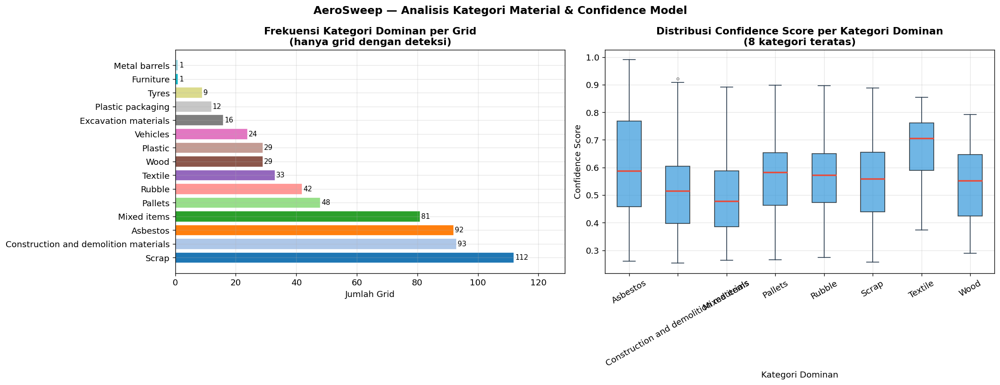

Gambar disimpan di: outputs/visual_category_confidence.png


In [7]:
def plot_category_and_confidence(csv_path: Path):
    """
    Buat dua visualisasi:
    1. Bar chart — frekuensi kategori dominan per grid
    2. Box plot — distribusi confidence score per kategori dominan

    Parameter
    ---------
    csv_path : Path ke output_fitur_ann_ke_fuzzy.csv
    """
    if not csv_path.exists():
        print(f"[ERROR] File CSV tidak ditemukan: {csv_path}")
        return

    df = pd.read_csv(csv_path)

    # Filter hanya grid dengan deteksi
    df_det = df[df["jumlah_instance"] > 0].copy()

    if df_det.empty:
        print("[WARNING] Tidak ada grid dengan deteksi di CSV.")
        return

    fig, axes = plt.subplots(1, 2, figsize=(18, 7))

    # --- Bar chart frekuensi kategori dominan ---
    cat_counts = (
        df_det["kategori_dominan"]
        .value_counts()
        .reset_index()
    )
    cat_counts.columns = ["kategori", "jumlah"]

    colors = plt.cm.tab20(np.linspace(0, 1, len(cat_counts)))
    bars   = axes[0].barh(
        cat_counts["kategori"],
        cat_counts["jumlah"],
        color     = colors,
        edgecolor = "white",
    )
    for bar, val in zip(bars, cat_counts["jumlah"]):
        axes[0].text(
            bar.get_width() + 0.3,
            bar.get_y() + bar.get_height() / 2,
            str(val),
            va="center", fontsize=9,
        )
    axes[0].set_xlabel("Jumlah Grid")
    axes[0].set_title(
        "Frekuensi Kategori Dominan per Grid\n"
        "(hanya grid dengan deteksi)",
        fontweight="bold",
    )
    axes[0].set_xlim(0, cat_counts["jumlah"].max() * 1.15)

    # --- Box plot confidence per kategori ---
    # Ambil 8 kategori teratas agar plot tidak terlalu padat
    top_cats = cat_counts["kategori"].head(8).tolist()
    df_top   = df_det[df_det["kategori_dominan"].isin(top_cats)]

    df_top.boxplot(
        column  = "confidence_score",
        by      = "kategori_dominan",
        ax      = axes[1],
        patch_artist = True,
        boxprops     = {"facecolor": "#3498DB", "alpha": 0.7},
        medianprops  = {"color": "#E74C3C", "linewidth": 2},
        whiskerprops = {"color": "#2C3E50"},
        capprops     = {"color": "#2C3E50"},
        flierprops   = {"marker": "o", "markersize": 3, "alpha": 0.4},
    )
    axes[1].set_title(
        "Distribusi Confidence Score per Kategori Dominan\n"
        "(8 kategori teratas)",
        fontweight="bold",
    )
    axes[1].set_xlabel("Kategori Dominan")
    axes[1].set_ylabel("Confidence Score")
    axes[1].tick_params(axis="x", rotation=30)
    plt.suptitle("")  # Hapus judul otomatis dari boxplot

    plt.suptitle(
        "AeroSweep — Analisis Kategori Material & Confidence Model",
        fontsize=14, fontweight="bold",
    )
    plt.tight_layout()
    plt.savefig(
        ROOT_DIR / "outputs" / "visual_category_confidence.png",
        bbox_inches="tight", dpi=120,
    )
    plt.show()
    print("Gambar disimpan di: outputs/visual_category_confidence.png")

# Jalankan
plot_category_and_confidence(OUTPUT_CSV_PATH)

### Validasi File CSV

In [8]:
def validate_csv_for_fuzzy(csv_path: Path):
    """
    Validasi akhir file CSV sebelum diserahkan ke tim GA-Fuzzy.

    Pengecekan:
    1. Semua kolom wajib ada
    2. Tidak ada missing values di kolom kritis
    3. Range nilai logis (density 0-100, conf 0-1, instance >= 0)
    4. Grid kosong ditangani dengan benar (nilai default, bukan NaN)

    Parameter
    ---------
    csv_path : Path ke output_fitur_ann_ke_fuzzy.csv
    """
    print("=" * 60)
    print("VALIDASI KESIAPAN CSV UNTUK TIM GA-FUZZY")
    print("=" * 60)

    if not csv_path.exists():
        print(f"[FAIL] ✗ File tidak ditemukan: {csv_path}")
        return

    df = pd.read_csv(csv_path)

    # Kolom wajib
    REQUIRED_COLS = [
        "grid_id", "centroid_x", "centroid_y",
        "area_density_pct", "jumlah_instance",
        "kategori_dominan", "confidence_score",
    ]

    checks_passed = 0
    checks_total  = 0

    def check(label: str, condition: bool, detail: str = ""):
        nonlocal checks_passed, checks_total
        checks_total += 1
        status = "✓ PASS" if condition else "✗ FAIL"
        color  = "" if condition else "[WARNING] "
        print(f"  {status} — {label}")
        if detail:
            print(f"           {color}{detail}")
        if condition:
            checks_passed += 1

    # 1. Kolom wajib ada
    missing_cols = [c for c in REQUIRED_COLS if c not in df.columns]
    check(
        "Semua kolom wajib ada",
        len(missing_cols) == 0,
        f"Kolom hilang: {missing_cols}" if missing_cols else "",
    )

    # 2. Tidak ada NaN di kolom kritis
    for col in ["area_density_pct", "jumlah_instance", "confidence_score"]:
        if col in df.columns:
            n_nan = df[col].isnull().sum()
            check(
                f"Tidak ada NaN di '{col}'",
                n_nan == 0,
                f"{n_nan} NaN ditemukan" if n_nan > 0 else "",
            )

    # 3. Range nilai logis
    if "area_density_pct" in df.columns:
        valid_range = df["area_density_pct"].between(0, 100).all()
        check(
            "area_density_pct dalam range [0, 100]",
            valid_range,
            f"min={df['area_density_pct'].min():.2f}, "
            f"max={df['area_density_pct'].max():.2f}",
        )

    if "confidence_score" in df.columns:
        valid_range = df["confidence_score"].between(0, 1).all()
        check(
            "confidence_score dalam range [0.0, 1.0]",
            valid_range,
            f"min={df['confidence_score'].min():.4f}, "
            f"max={df['confidence_score'].max():.4f}",
        )

    if "jumlah_instance" in df.columns:
        valid_non_neg = (df["jumlah_instance"] >= 0).all()
        check(
            "jumlah_instance >= 0 (tidak ada nilai negatif)",
            valid_non_neg,
        )

    # 4. Grid kosong ditangani dengan benar
    if "jumlah_instance" in df.columns and "centroid_x" in df.columns:
        empty_grids     = df[df["jumlah_instance"] == 0]
        correct_default = (
            (empty_grids["centroid_x"]  == -1).all() and
            (empty_grids["centroid_y"]  == -1).all() and
            (empty_grids["area_density_pct"] == 0.0).all() and
            (empty_grids["confidence_score"] == 0.0).all()
        ) if len(empty_grids) > 0 else True

        check(
            "Grid kosong memiliki nilai default yang benar",
            correct_default,
            f"({len(empty_grids)} grid kosong ditemukan)",
        )

    # 5. grid_id unik
    n_dup = df["grid_id"].duplicated().sum()
    check(
        "Tidak ada grid_id duplikat",
        n_dup == 0,
        f"{n_dup} duplikat ditemukan" if n_dup > 0 else "",
    )

    # --- Ringkasan ---
    print()
    print("=" * 60)
    print(
        f"HASIL: {checks_passed}/{checks_total} pengecekan PASSED"
    )
    if checks_passed == checks_total:
        print("STATUS: ✅ CSV SIAP dikirim ke tim GA-Fuzzy!")
    else:
        print("STATUS: ⚠️  Ada pengecekan yang gagal, periksa WARNING di atas.")
    print(f"File  : {csv_path}")
    print(f"Baris : {len(df)}")
    print("=" * 60)

# Jalankan
validate_csv_for_fuzzy(OUTPUT_CSV_PATH)

VALIDASI KESIAPAN CSV UNTUK TIM GA-FUZZY
  ✓ PASS — Semua kolom wajib ada
  ✓ PASS — Tidak ada NaN di 'area_density_pct'
  ✓ PASS — Tidak ada NaN di 'jumlah_instance'
  ✓ PASS — Tidak ada NaN di 'confidence_score'
  ✓ PASS — area_density_pct dalam range [0, 100]
           min=0.00, max=97.20
  ✓ PASS — confidence_score dalam range [0.0, 1.0]
           min=0.0000, max=0.9903
  ✓ PASS — jumlah_instance >= 0 (tidak ada nilai negatif)
  ✓ PASS — Grid kosong memiliki nilai default yang benar
           (3373 grid kosong ditemukan)
  ✓ PASS — Tidak ada grid_id duplikat

HASIL: 9/9 pengecekan PASSED
STATUS: ✅ CSV SIAP dikirim ke tim GA-Fuzzy!
File  : D:\Arsip Hafizh Fadhl Muhammad\Project\aerosweep\outputs\output_fitur_ann_ke_fuzzy.csv
Baris : 3995
